# Otoczka wypukła

In [1]:
# Module handling
import os
import sys
module_path = os.path.abspath(os.path.join('..','..'))
if module_path not in sys.path:
    sys.path.append(module_path)
# Plots, visualisations and tests
from visualizer.main import Visualizer
from tests.test2 import Test
# Utils
import numpy as np
import pandas as pd
# Colour constants
BLUE = '#1f9cdb'
RED = 'red'
GREEN = '#5aa832'

### Przykładowe zastosowanie narzędzia do wizualizacji

In [2]:
def draw_example_1():
    vis = Visualizer()

    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points, color="green")
    vis.add_line_segment(line_segments, color="blue")
    vis.show()

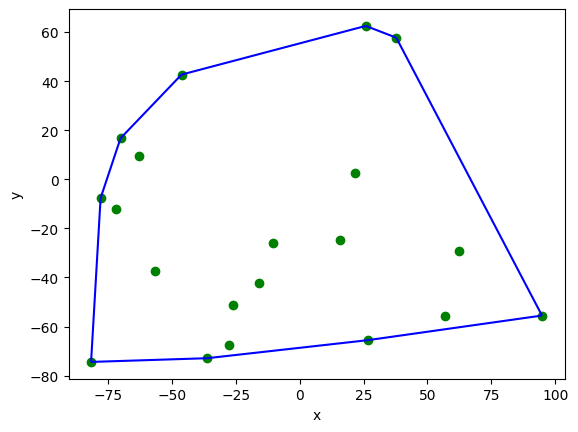

In [3]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym iff, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczku wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zastosowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przepuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostrze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały orginały. Jeśli chcemy sprwadzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na orginalnych obiektach, który jest przepuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

Zapoznaliśmy się i wiemy jak generowac losowe punkty na płaszczyźnie z laboratorium I (współrzędne rzeczywiste typu *double* - podwójna precyzja obliczeń). Przygotuj zestawy punktów, które będzie można użyć jako testowe dla algorytmów obliczania otoczki wypukłej.

Uzupełnij funkcję ```generate_uniform_points```.

In [4]:
def generate_uniform_points(left=-100, right=100, n=100):
    """
    Funkcja generuje równomiernie n punktów na kwadwratowym
    obszarze od left do right (jednakowo na osi y)
    o współrzędnych rzeczywistych
    :param left: lewy kraniec przedziału
    :param right: prawy kraniec przedziału
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
             np. [(x1, y1), (x2, y2), ... (xn, yn)]
    """
    random_pairs = np.random.uniform(left, right, size=(n, 2))
    tuples = [tuple(row) for row in random_pairs]
    return tuples

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $x \in \langle -100,100 \rangle$ oraz $y \in \langle -100,100\rangle$.

In [5]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

In [6]:
def visualise_points(points_set, color=BLUE):
  vis = Visualizer()
  vis.add_point(points_set)
  vis.axis_equal()
  vis.show()

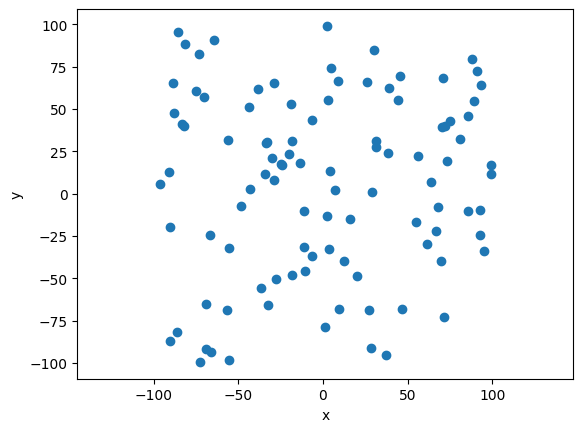

In [7]:
visualise_points(points_a)

Uzupełnij funkcję ```generate_circle_points```.

In [8]:
def generate_circle_points(O, R, n=100):
    """
    Funkcja generuje jednostajnie n punktów na okręgu o środku O i promieniu R
    :param O: krotka współrzędnych x, y określająca środek okręgu
    :param R: promień okręgu
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    """
    angles = np.random.uniform(0, 2 *np.pi, n)
    x = R * np.cos(angles) + O[0]
    y = R * np.sin(angles) + O[1]
    tuples = [(x[i], y[i]) for i in range(n)]

    return tuples

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [9]:
points_b = generate_circle_points((0, 0), 10, 100)

Zwizualizuj wygenerowane punkty.

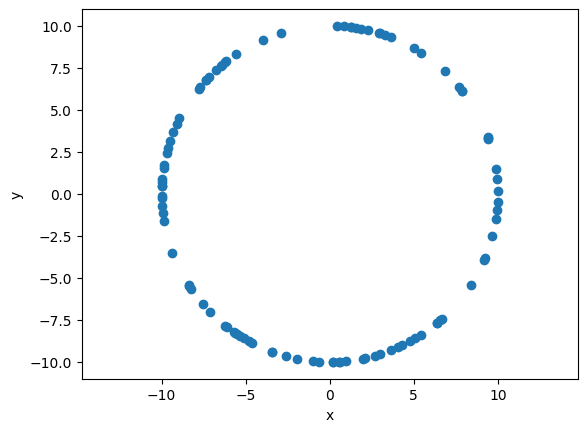

In [10]:
visualise_points(points_b)

Jak można było zauważyć, to funkcje ```generate_uniform_points``` oraz ```generate_circle_points``` są takie same jak w laboratorium I.

Uzupełnij funkcję ```generate_rectangle_points```.

In [11]:
def distance(a: tuple,b: tuple):
  return np.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)

def create_lengths_array(a,b,c,d):
  A = [distance(a,b) ,distance(b,c), distance(c,d), distance(d,a)]
  for i in range(1,4):
    A[i] = A[i-1] + A[i]
  return A
create_lengths_array(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10))

def generate_vector(a,b):
  dist = distance(a,b)
  return ((b[0]-a[0])/dist, (b[1]-a[1])/dist)

def get_all_vectors(a,b,c,d):
  return [generate_vector(a,b), generate_vector(b,c), generate_vector(c,d), generate_vector(d,a)]

get_all_vectors(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10))

[(np.float64(1.0), np.float64(0.0)),
 (np.float64(0.0), np.float64(1.0)),
 (np.float64(-1.0), np.float64(0.0)),
 (np.float64(0.0), np.float64(-1.0))]

In [12]:
def generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=100):
    '''
    Funkcja generuje n punktów na obwodzie prostokąta
    o wierzchołkach w punktach a, b, c i d
    :param a: lewy-dolny wierzchołek prostokąta
    :param b: prawy-dolny wierzchołek prostokąta
    :param c: prawy-górny wierzchołek prostokąta
    :param d: lewy-górny wierzchołek prostokąta
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    # "Unfold" the rectangle, generate poitns on a line, move them onto the "rectangle"
    points = [a,b,c,d]
    length_arr = create_lengths_array(a,b,c,d)
    vectors = get_all_vectors(a,b,c,d)
    x_vals = np.random.uniform(0, length_arr[3], n)
    point_set = [0] * len(x_vals)
    
    
    for i,val in enumerate(x_vals):
      idx = 3
      if(val <= length_arr[2]): idx = 2
      if(val <= length_arr[1]): idx = 1
      if(val <= length_arr[0]): idx = 0
      
      x_value = val - (length_arr[idx-1] if idx-1 > -1 else 0) 
      point_set[i] = (points[idx][0] + x_value * vectors[idx][0], points[idx][1] + x_value * vectors[idx][1])
      
    return point_set
    

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na obwodzie prostokąta, którego wyznaczają wierzchołki
$(-10,-10), (10,-10), (10,10)$ oraz $(-10,10)$.

In [13]:
points_c = generate_rectangle_points(
    (-10, -10), (10, -10), (10, 10), (-10, 10), 100)

Zwizualizuj wygenerowane punkty.

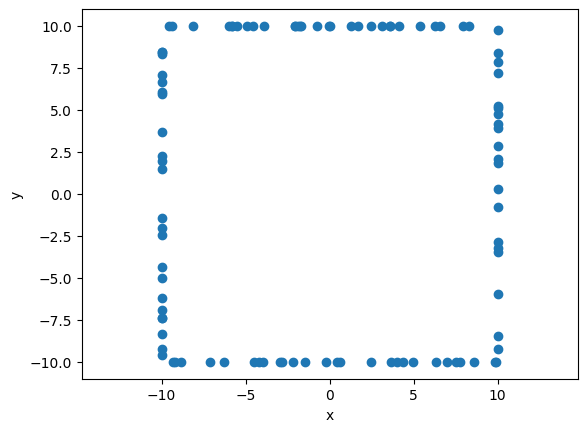

In [14]:
visualise_points(points_c)

Uzupełnij funkcję ```generate_square_points```.

In [15]:
def generate_diameter_vectors(a,b,c,d):
  return [generate_vector(a,c), generate_vector(b,d)] 

In [16]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10),
                           axis_n=25, diag_n=20):
    '''
    Funkcja generuje axis_n punktów na dwóch bokach kwadratu
    leżących na osiach x i y oraz diag_n punktów na
    przektąnych kwadratu, którego wyznaczają punkty
    a, b, c i d.
    :param a: lewy-dolny wierzchołek kwadratu
    :param b: prawy-dolny wierzchołek kwadratu
    :param c: prawy-górny wierzchołek kwadratu
    :param d: lewy-górny wierzchołek kwadratu
    :param axis_n: ilość generowanych punktów na każdym
                   z dwóch boków kwadratu równoległych do osi x i y
    :param diag_n: ilość generowanych punktów na każdej
                   przekątnej kwadratu
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    length_1 = distance(d,a)
    length_2 = distance(a,b)
    length_diag_1 = distance(a,c)
    length_diag_2 = distance(b,d)
    
    points_perimiter_1 = np.random.uniform(0, length_1, axis_n)
    points_perimiter_2 = np.random.uniform(0, length_2, axis_n)
    points_diag_1 = np.random.uniform(0, length_diag_1, diag_n)
    points_diag_2 = np.random.uniform(0, length_diag_2, diag_n)
    
    parameters = (points_perimiter_1, points_perimiter_2, points_diag_1, points_diag_2)
    vectors = (generate_vector(d,a), generate_vector(a,b), generate_vector(a,c), generate_vector(b,d))
    lines = ((d,a), (a,b), (a,c), (b,d))
    points_set = [0] * (2*axis_n + 2*diag_n)
    
    idx = 0
    for i in range(4):
      for t in parameters[i]:
        x_coord, y_coord = lines[i][0]
        x_val = x_coord +  vectors[i][0] * t
        y_val = y_coord +  vectors[i][1] * t
        points_set[idx] = (x_val,y_val)
        idx+=1
        
    points_set += [a,b,c,d]
        
    return points_set

<span style="color:red">Ćw.</span> Wygeneruj losowe punktów w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu, zawierający punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10)$ oraz $(0, 10)$.

In [17]:
points_d = generate_square_points(
    (0, 0), (10, 0), (10, 10), (0, 10), 25, 20)

Zwizualizuj wygenerowane punkty.

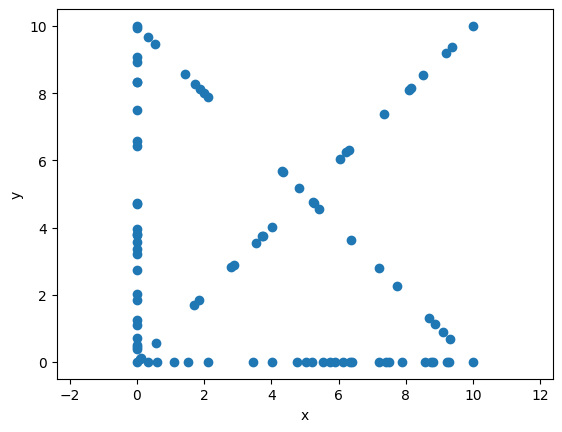

In [18]:
visualise_points(points_d)

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algortymów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli funkcja, która sprawdza po której stornie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłę, ze względu, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie uzyteczna do porównywania czasów dla różnych zbiorów danych i względęm algorytmów.  
W graficznej funkcji danego algorytmu, jednym kolorem powinny być zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki powinny być wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt z zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegera.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt ponieżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(p, S)}$ usuwa punkt $p$ ze stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$,  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tą samą współrzędną $x$  
    
2)  nich $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$ posortowanym  
    zgodnie z przeciwnym ruchem wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.  
  

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

In [19]:
def mat_det_2x2(a, b, c):
    """
    Obliczanie wyznacznika macierzy 2x2 bez użycia funkcji bibliotecznych
    :param a: krotka współrzędnych (x, y) pierwszego punktu tworzącego naszą prostą
    :param b: krotka współrzędnych (x, y) drugiego punktu tworzącego naszą prostą
    :param c: krotka współrzędnych (x, y) punktu, którego położenie względem prostej chcemy znaleźć
    :return: wartość wyznacznika macierzy
    """
    a1,a2 = a
    b1,b2 = b
    c1,c2 = c
    return (a1-c1) * (b2-c2) - (a2-c2) * (b1-c1)

In [20]:
def orient(a,b,c):
  return mat_det_2x2(a,b,c)

In [21]:
def compare(a,b,c):
  # compare b with c
  # a is the point according to which we sort
  
  EPS = 10**(-24)

  result = orient(a,b,c)
  if(abs(result) <= EPS):
    return 0
  elif(result < 0):
    return -1
  elif(result > 0):
    return 1

In [22]:
def dist(a,b):
  # We dont have to use sqrt during comparison
  return ((a[0]-b[0])**2 + (a[1]-b[1])**2)

In [23]:
def find_min(Q, index=False):
  n = len(Q)
  j=0
  for i in range(n):
    if((Q[j][1] == Q[i][1] and Q[i][0] < Q[j][0]) or Q[j][1] > Q[i][1]):
      j =  i
  return Q[j] if not index else (Q[j],j)

In [24]:
def merge(A,B,a):
  n,m = len(A), len(B)
  
  C = []
  i = j =  0
  while(i < n and j < m):
    result = compare(a,A[i],B[j])

    if(result > 0):
      C.append(A[i])
      i+=1
    elif(result < 0):
      C.append(B[j])
      j+=1
    else:
      if(dist(a,A[i]) > dist(a, B[j])):
        j+=1
      else:
        i+=1
  
  while(i < n):
    if(len(C) == 0 or compare(a,C[-1], A[i]) != 0 ):
      C.append(A[i])
    i+=1
  while(j<m):
    if(len(C) == 0 or compare(a, C[-1], B[j]) != 0):
      C.append(B[j])
    j+=1
  return C

def _merge_sort(Q:list, a):
  n = len(Q)
  if(n <= 1): return Q
  p = n//2
  A = _merge_sort(Q[:p], a)
  B = _merge_sort(Q[p:], a)
  C = merge(A,B,a)
  
  return C

def merge_sort(Q):
  a = find_min(Q)
  Q = [p for p in Q if p != a]
  C = _merge_sort(Q,a)
  return [a] + C

In [25]:
def is_left(point, stack_first, stack_second):
  return orient(stack_second,stack_first, point) < 0

In [26]:

def graham_build(Q):
  return merge_sort(Q)

In [27]:
def graham_algorithm(_Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    
    Q = graham_build(_Q)
    n = len(Q)
    
    if(n < 3): return Q
    
    stack = [Q[0], Q[1], Q[2]]
    
    for i in range(3,n):
      while(not is_left(stack[-2], stack[-1], Q[i]) and len(stack) > 2):
        stack.pop()
      stack.append(Q[i])
      
    if(not is_left(stack[-2], stack[-1], stack[0])):
      stack.pop()
      
    return stack
    

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [28]:
Test().runtest(1, graham_algorithm)

Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 3.297s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

In [29]:
def add_point_to_convex(point: tuple[int, int], stack: list, edges: list, vis: Visualizer):
  stack.append(list(point))
  vis.add_point(point, color=RED)
  if(len(stack) > 1):
    line_segment = [stack[-1], stack[-2]]
    segment = vis.add_line_segment(line_segment, color=RED)
    
    edges.append(segment)

In [30]:
def remove_point_from_convex(stack: list, edges: list, vis: Visualizer):
  point = stack.pop()
  vis.add_point(point, color=BLUE)
  segment = edges.pop()
  vis.remove_figure(segment)

In [31]:
def initialise_stack(starting_points: list[tuple[int, int]], vis:Visualizer):
  stack = []
  edges = []
  add_point_to_convex(starting_points[0],stack,edges,vis)
  for i in range(1,len(starting_points)):
    add_point_to_convex(starting_points[i], stack,edges,vis)
  return stack, edges

In [32]:
def create_edge_list(Q):
  E = list(zip(Q[:-1], Q[1:]))
  E.append((Q[-1],Q[0]))
  return E

In [33]:
def graham_algorithm_draw(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama oraz
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''
    
    vis = Visualizer()
    vis.axis_equal()
    vis.add_point(Q, color=BLUE)
    convex = graham_build(Q)
    n = len(convex)
    
    if(n < 3): return Q
    
    stack, edges = initialise_stack([convex[0], convex[1], convex[2]], vis)
    
    for i in range(3,n):
      while(not is_left(stack[-2], stack[-1], convex[i]) and len(stack) > 2):
        remove_point_from_convex(stack,edges,vis)
      add_point_to_convex(convex[i],stack,edges,vis)
      
    if(not is_left(stack[-2], stack[-1], stack[0])):
      remove_point_from_convex(stack,edges,vis)
      
    return stack, vis

In [34]:
# Function visualising the convex hull for a set
def show_convex_hull(point_set, convex_set, points_color=BLUE, convex_color=RED):
  vis = Visualizer()
  vis.axis_equal()
  vis.add_point(point_set, color=points_color)
  vis.add_point(convex_set, color=convex_color)
  vis.add_line_segment([(convex_set[i], convex_set[i+1]) for i in range(len(convex_set)-1)], color=convex_color)
  vis.add_line_segment([convex_set[-1], convex_set[0]], color=convex_color)
  vis.show()
  

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [35]:
graham_points_a, vis_graham_a = graham_algorithm_draw(points_a)

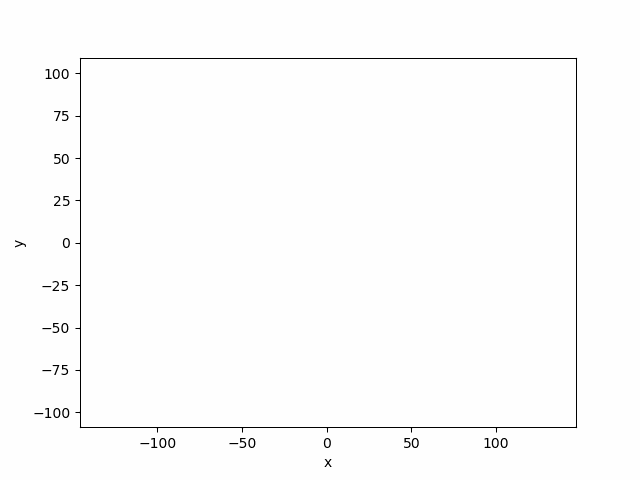

In [103]:
vis_graham_a.show_gif(interval=100)

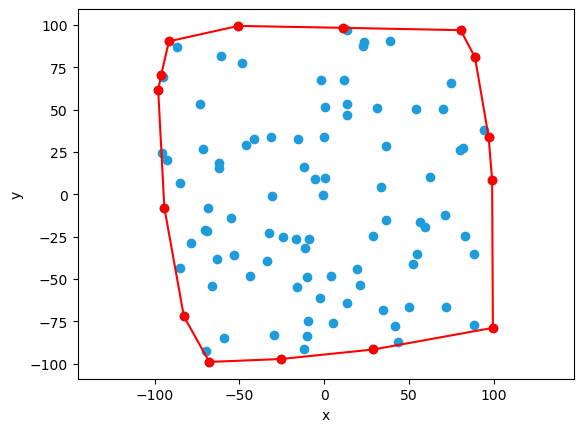

In [104]:
show_convex_hull(points_a, graham_points_a)

Zbiór danych B

In [36]:
graham_points_b, vis_graham_b = graham_algorithm_draw(points_b)

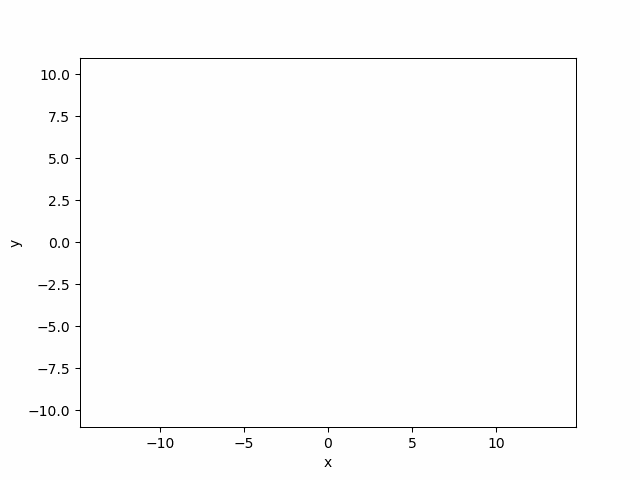

In [106]:
vis_graham_b.show_gif(interval=100)

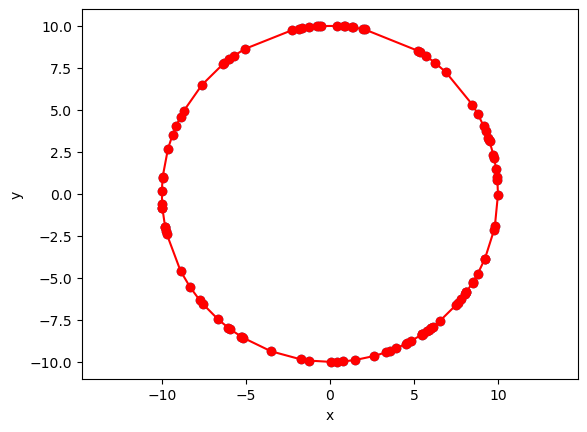

In [107]:
show_convex_hull(points_b, graham_points_b )

Zbiór danych C

In [37]:
graham_points_c, vis_graham_c = graham_algorithm_draw(points_c)

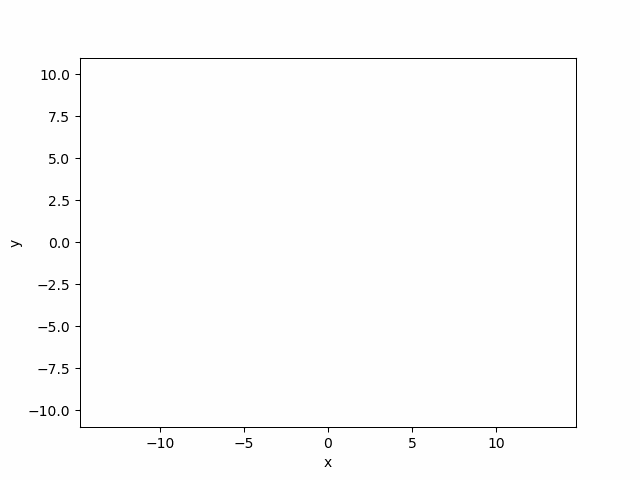

In [109]:
vis_graham_c.show_gif(interval=100)

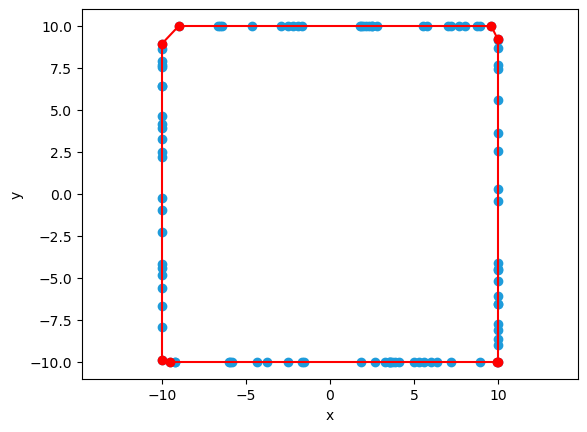

In [110]:
show_convex_hull(points_c, graham_points_c)

Zbiór danych D

In [38]:
graham_points_d, vis_graham_d = graham_algorithm_draw(points_d)

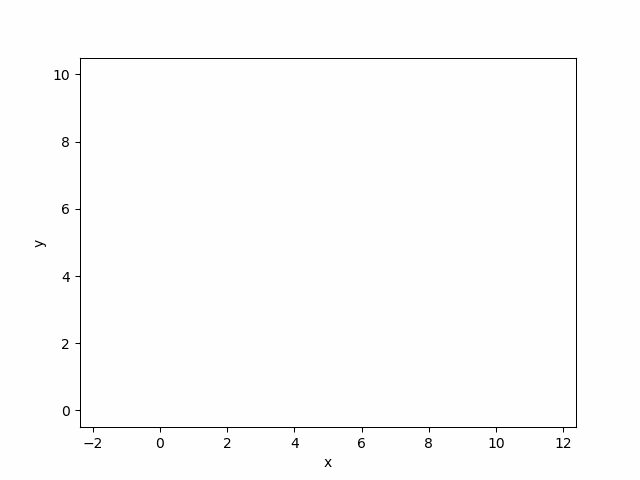

In [112]:
vis_graham_d.show_gif(interval=100)

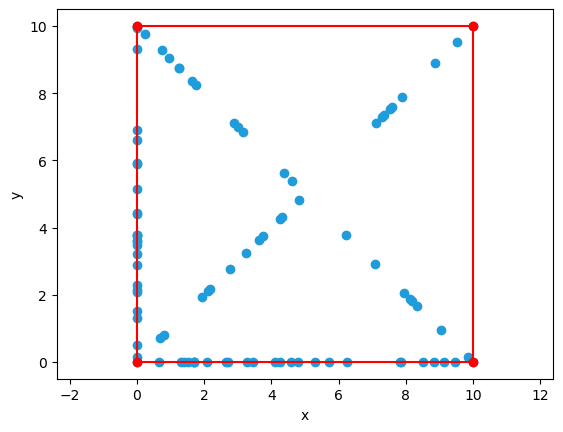

In [113]:
show_convex_hull(points_d, graham_points_d)

### Algorytm Jarvisa

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_1, p_2, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, gdy $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$, itd.. Zauważyć warto, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie. Gdy osiągniemy najwyższy wierzchołej w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej osi-$x$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej. (Patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od budowanego punktu)

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

In [39]:
def jarvis_algorithm(Q):
  '''
  Funkcja buduje otoczkę wypukłą dla podanego
  zbioru punktów Q algorymem Jarvisa
  :parm Q: zbiór punktów
  :return: tablica punktów w postaci krotek współrzędnych
  '''
    
  n = len(Q)
  point, j = find_min(Q, index=True)
  convex = []
  
  current, next = j, 0
  
  while(True):
    convex.append(Q[current])
    
    next=(current+1)%n
    
    for i in range(n):
      result = compare(Q[current], Q[i], Q[next])
      if(result == 1 or (result == 0 and dist(Q[current],Q[i]) > dist(Q[current], Q[next]))):
        next = i
    
    current = next
    
    if(current == j): break 
  
  return convex

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [40]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 2.406s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [41]:
def jarvis_algorithm_draw(Q, points_color=BLUE, convex_color=RED, test_color=GREEN):
  '''
  Funkcja buduje otoczkę wypukłą dla podanego
  zbioru punktów Q algorymem Jarvisa
  :parm Q: zbiór punktów
  :return: tablica punktów w postaci krotek współrzędnych
  '''
    
  n = len(Q)
  point, j = find_min(Q, index=True)
  convex = []
  
  current, next = j, 0
  
  vis = Visualizer()
  vis.axis_equal()
  vis.add_point(Q, color=points_color)
  
  line_segment = None
  
  while(True):
    convex.append(Q[current])
    
    next=(current+1)%n
    
    for i in range(n):
      if(i != current and i != next):
        line_segment = [Q[current], Q[next]]
        result = compare(Q[current], Q[i], Q[next])
        if(result == 1 or (result == 0 and dist(Q[current],Q[i]) > dist(Q[current], Q[next]))):
          # Draw process of testing next edges one by one
          vis_testing_edge = vis.add_line_segment(line_segment, color=test_color)
          vis_point = vis.add_point(Q[next], color=test_color)
          vis.remove_figure(vis_point)
          vis.remove_figure(vis_testing_edge)
          next = i
         
    # Draw part of actual convex
    vis.add_line_segment(line_segment, color=convex_color)
    vis.add_point(Q[next], color=convex_color)
    current = next
    
    if(current == j): 
      
      break 
  
  return convex, vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [42]:
jarvis_points_a, vis_jarvis_a = jarvis_algorithm_draw(points_a)

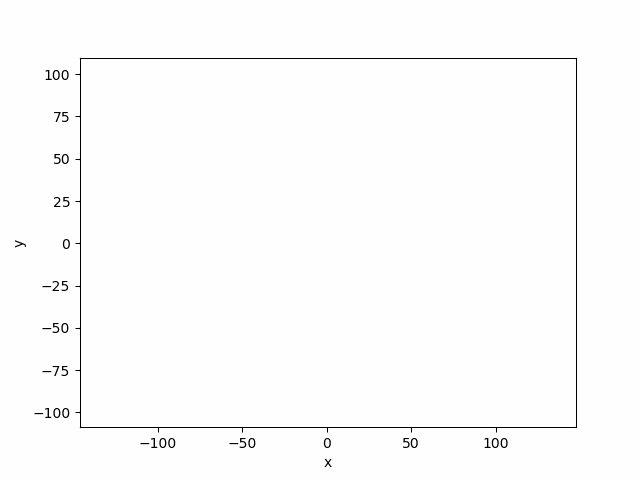

In [42]:
vis_jarvis_a.show_gif(interval=100)

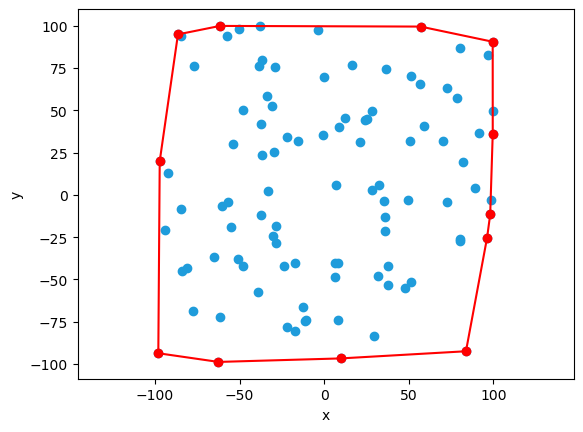

In [41]:
show_convex_hull(points_a, jarvis_points_a)

Zbiór danych B

In [43]:
jarvis_points_b, vis_jarvis_b = jarvis_algorithm_draw(points_b)

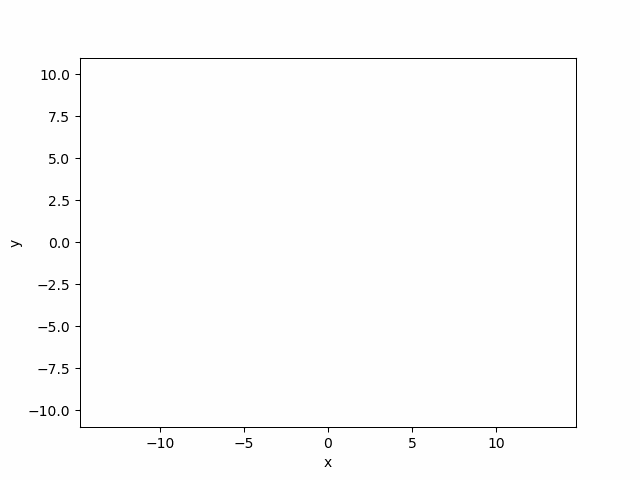

In [121]:
vis_jarvis_b.show_gif(interval=100)

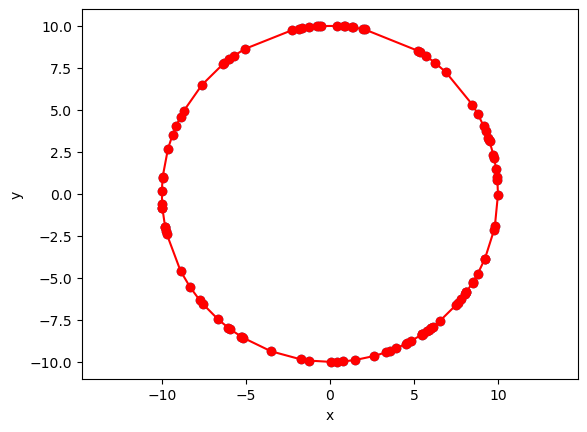

In [122]:
show_convex_hull(points_b, jarvis_points_b)

Zbiór danych C

In [44]:
jarvis_points_c, vis_jarvis_c = jarvis_algorithm_draw(points_c)

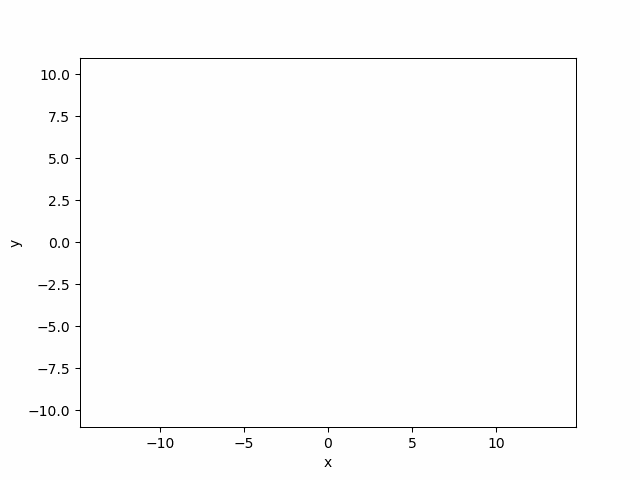

In [124]:
vis_jarvis_c.show_gif(interval=100)

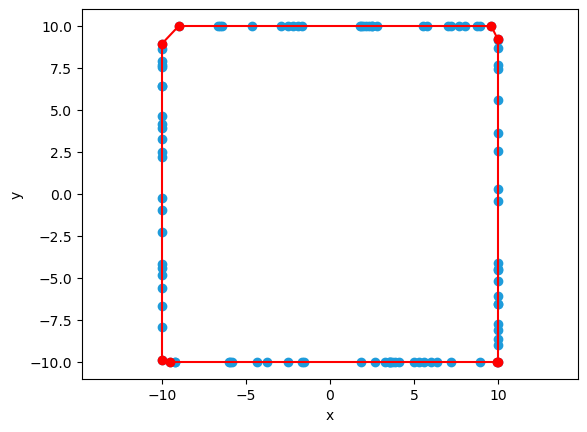

In [125]:
show_convex_hull(points_c, graham_points_c)

Zbiór danych D

In [45]:
jarvis_points_d, vis_jarvis_d = jarvis_algorithm_draw(points_d)

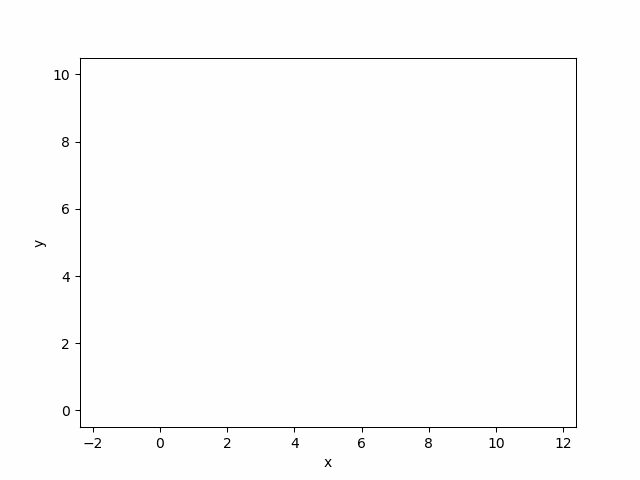

In [127]:
vis_jarvis_d.show_gif(interval=100)

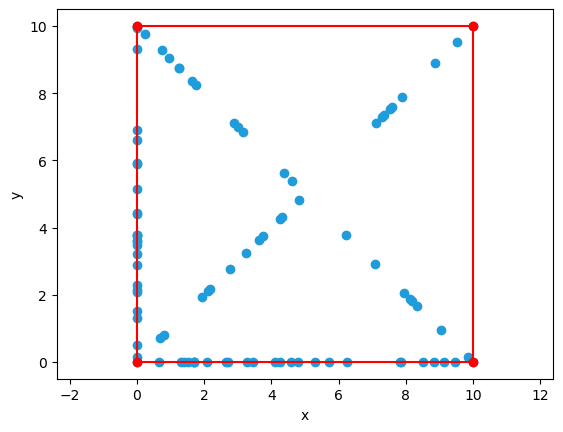

In [128]:
show_convex_hull(points_d, graham_points_d)


---

Po zobaczeniu i przetestowaniu wstępnie zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów danych.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D - tak jak uważasz za słuszne.

In [46]:
# prepare your data to time-test
from dataclasses import dataclass
from typing import Union

@dataclass
class Area:
  num_of_points: int
  left: int
  right: int

@dataclass
class Circle:
  center: tuple[float, float]
  radius: float
  num_of_points: int

@dataclass
class UniformRectangle:
  a: tuple[int,int]
  b: tuple[int,int]
  c: tuple[int,int]
  d: tuple[int,int]
  num_of_points: int

@dataclass
class Square:
  a: tuple[int,int]
  b: tuple[int,int]
  c: tuple[int,int]
  d: tuple[int,int]
  num_on_perimiter: int
  num_on_diagonal: int


def generate_sets(sets_params: list[Union[Area, Circle, UniformRectangle, Square]]):
  testing_set = []
  if(type(sets_params[0]) == Area):
    for params in sets_params:
      testing_set.append(generate_uniform_points(params.left, params.right, params.num_of_points))
  if(type(sets_params[0]) == Circle):
    for params in sets_params:
      testing_set.append(generate_circle_points(params.center, params.radius, params.num_of_points))
  if(type(sets_params[0]) == UniformRectangle):
    for params in sets_params:
      testing_set.append(generate_rectangle_points(params.a, params.b, params.c, params.d, params.num_of_points))
  if(type(sets_params[0]) == Square):
    for params in sets_params:
      testing_set.append(generate_square_points(params.a, params.b, params.c, params.d, params.num_on_perimiter, params.num_on_diagonal))
      
  return testing_set



A_params = [100, 500, 1000, 5000, 10**4]
B_params = [((0,0), 100, 100), ((0,0), 500, 500), ((0,0), 1000, 1000), ((0,0), 5000, 5000), ((0,0), 10**4, 10**4)]
C_params = [100, 500, 1000, 5000, 10**4]
D_params = [25, 125, 250, 1250, 2500]

A_sets = [Area(num, -num, num) for num in A_params]
B_sets = [Circle(center, R, num) for center,R,num in B_params]
C_sets = [
  UniformRectangle(
    (-num//10, -num//10), 
    (-num//10, num//10), 
    (num//10,num//10), 
    (-num//10, num//10), 
    num
  ) for num in C_params]

D_sets = [
  Square(
    (-(num*4)//10, -(num*4)//10), 
    ((num*4)//10, -(num*4)//10), 
    ((num*4)//10, (num*4)//10), 
    (-(num*4)//10, (num*4)//10), 
    num, 
    num
  ) for num in D_params]

Po przygotowaniu zbioru danych, dokonaj porównania czasowego  
<span style="color:red">Ćw.</span> Porównaj zmodyfikowane zbiory danych A, B, C oraz D dla algorytmów Grahama i Jarvisa.

In [47]:
# compare your sets of data 
import time
from dataclasses import fields

def test_convex_hull_time(test_set, test_set_params, test_set_name):
  attributes = [attr.name for attr in fields(test_set_params[0])]
  df = pd.DataFrame(columns=['set', 'graham', 'jarvis'] + [attr for attr in attributes])
  for i,test in enumerate(test_set):
    row = {}
    for attr in attributes:
      row[attr] = getattr(test_set_params[i], attr)
      
    start_jarvis = time.perf_counter()
    points_graham = graham_algorithm(test)
    end_graham = time.perf_counter()
    time_graham = end_graham - start_jarvis
    
    start_jarvis = time.perf_counter()
    points_jarvis = jarvis_algorithm(test)
    end_graham = time.perf_counter()
    time_jarvis = end_graham - start_jarvis
    
    if(len(points_jarvis) != len(points_graham)):
      raise Exception(f'THE CONVEX HULL SETS ARE OF DIFFERENT SIZES: \n GRAHAM: {len(points_graham)}, JARVIS: {len(points_jarvis)}')

    row['graham'] = time_graham
    row['jarvis'] = time_jarvis
    row['set'] = test_set_name
    df.loc[i] = row
  return df

In [49]:
def get_amount_of_points(point_sets: list[list[tuple[int,int]]], point_sets_names: list[str]):
  df = pd.DataFrame(columns=['Algorytm'] + [name for name in point_sets_names])
  # row_original = {}
  row_graham = {}
  row_jarvis = {}
  
  row_graham['Algorytm'] = 'Graham'
  row_jarvis['Algorytm'] = 'Jarvis'
  for i,points in enumerate(point_sets):
    # row_original[point_sets_names[i]] = len(points)
    
    row_graham[point_sets_names[i]] = len(graham_algorithm(points))
    row_jarvis[point_sets_names[i]] = len(jarvis_algorithm(points))
  # df.loc[0] = row_original
  df.loc[1] = row_graham
  df.loc[2] = row_jarvis
  
  return df

In [50]:
# Tests
import os

path_csv = os.path.join(os.curdir,'data')
sets = [A_sets, B_sets, C_sets, D_sets]
sets_params = [A_params, B_params, C_params, D_params]
sets_names = ['A','B','C','D']

if(not os.path.exists(path_csv)):
    os.makedirs(path_csv)

print('CZAS WYZNACZANIA OTOCZKI WYPUKŁEJ W POSZCZEGÓLNYCH ZBIORACH')
for i in range(len(sets)):
  df = test_convex_hull_time(generate_sets(sets[i]), sets[i], sets_names[i])
  df.to_csv(os.path.join(path_csv, f'convex_{sets_names[i]}.csv'), sep=';')
  print(df)


amount_points_sets = [points_a, points_b, points_c, points_d]
amount_points_names = ['Zbiór A', 'Zbiór B', 'Zbiór C', 'Zbiór D']
df_amount = get_amount_of_points(amount_points_sets, amount_points_names)
df_amount.to_csv(os.path.join(path_csv, f'point_amount.csv'), sep=';')

print('ILOŚĆ PUNKTÓW W POSZCZEGÓLNYCH ZBIORACH')
print(df_amount)

CZAS WYZNACZANIA OTOCZKI WYPUKŁEJ W POSZCZEGÓLNYCH ZBIORACH
  set    graham    jarvis  num_of_points   left  right
0   A  0.000811  0.001120            100   -100    100
1   A  0.006337  0.008551            500   -500    500
2   A  0.011682  0.014694           1000  -1000   1000
3   A  0.067436  0.062206           5000  -5000   5000
4   A  0.153840  0.227880          10000 -10000  10000
  set    graham     jarvis  center  radius  num_of_points
0   B  0.001376   0.010092  (0, 0)     100            100
1   B  0.006538   0.189026  (0, 0)     500            500
2   B  0.019615   0.723568  (0, 0)    1000           1000
3   B  0.060915  18.988394  (0, 0)    5000           5000
4   B  0.132272  81.284716  (0, 0)   10000          10000
  set    graham    jarvis               a              b             c  \
0   C  0.001847  0.000968      (-10, -10)      (-10, 10)      (10, 10)   
1   C  0.005315  0.002391      (-50, -50)      (-50, 50)      (50, 50)   
2   C  0.010577  0.005534    (-100, -100

WNIOSKI HERE  
W sprawozdaniu napisz, czy Twój program działał poprawnie dla wszystkich zbiorów
danych oraz opisz krótko wnioski dotyczące działania algorytmu dla poszczególnych
zbiorów. Napisz, dlaczego wg Ciebie zaproponowano takie zbiory punktów? Które ze
zbiorów mogły stwarzać problemy w działaniu algorytmów? Jeśli tak, to jakie i
dlaczego? Porównaj czasy działania obu algorytmów w zależności od liczby punktów
w poszczególnych zbiorach (A, B, C, D). Dołącz wybrane, istotne ilustracje.

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford
